# < Check Annotations > 

- Dataset: 
> mit-bih-arrhythmia-database-1.0.0
> https://physionet.org/content/mitdb/1.0.0/


### 0. Load packages

In [3]:
import pandas as pd
import numpy as np
import matplotlib
%matplotlib inline
import matplotlib.pylab as plt
import os
import sys
import glob
import tqdm
import random
import time
from itertools import cycle
import warnings
warnings.filterwarnings(action='ignore')

import wfdb

from sklearn.metrics import roc_auc_score, roc_curve, classification_report, auc
from sklearn.preprocessing import label_binarize

In [4]:
# datapath
datapath = 'c:/users/MI2RL-KHJ/2022_Project/Signal/mit-bih-arrhythmia-database-1.0.0'
# mimic dataset 파일 구성: hea, atr, dat, xws
print(os.listdir(datapath))

header_files = [os.path.basename(x) for x in glob.glob(os.path.join(datapath, '*.hea'))]
pids = sorted([x.split('.')[0] for x in header_files])

['100.atr', '100.dat', '100.hea', '100.xws', '101.atr', '101.dat', '101.hea', '101.xws', '102-0.atr', '102.atr', '102.dat', '102.hea', '102.xws', '103.atr', '103.dat', '103.hea', '103.xws', '104.atr', '104.dat', '104.hea', '104.xws', '105.atr', '105.dat', '105.hea', '105.xws', '106.atr', '106.dat', '106.hea', '106.xws', '107.atr', '107.dat', '107.hea', '107.xws', '108.atr', '108.at_', '108.dat', '108.hea', '108.xws', '109.atr', '109.dat', '109.hea', '109.xws', '111.atr', '111.dat', '111.hea', '111.xws', '112.atr', '112.dat', '112.hea', '112.xws', '113.atr', '113.dat', '113.hea', '113.xws', '114.atr', '114.dat', '114.hea', '114.xws', '115.atr', '115.dat', '115.hea', '115.xws', '116.atr', '116.dat', '116.hea', '116.xws', '117.atr', '117.at_', '117.dat', '117.hea', '117.xws', '118.atr', '118.dat', '118.hea', '118.xws', '119.atr', '119.at_', '119.dat', '119.hea', '119.xws', '121.atr', '121.dat', '121.hea', '121.xws', '122.atr', '122.dat', '122.hea', '122.xws', '123.atr', '123.dat', '123.he

---

In [ ]:
# header_files = [os.path.basename(x) for x in glob.glob(os.path.join(datapath, '*.hea'))]
# pids = sorted([x.split('.')[0] for x in header_files])

In [5]:
# annotation 파일 불러와서 label의 분포 확인
df = pd.DataFrame()

for pid in pids:
    file = os.path.join(datapath, pid)
    annotation = wfdb.rdann(os.path.join(file), 'atr')
    symbols = annotation.symbol
    
    values, cnts = np.unique(symbols, return_counts=True)
    df_sub = pd.DataFrame({'symbol': values, 'value': cnts, 'pid':[pid] * len(cnts)})
    df = pd.concat([df, df_sub], axis=0)

In [6]:
# Annotation 파일의 분포
df.groupby('symbol').value.sum().sort_values(ascending = False)

symbol
N    75052
L     8075
R     7259
V     7130
/     7028
A     2546
+     1291
f      982
F      803
~      616
!      472
"      437
j      229
x      193
a      150
|      132
E      106
J       83
Q       33
e       16
[        6
]        6
S        2
Name: value, dtype: int64

#### 1. Annotation criteria

In [7]:
# list of nonbeat and abnormal
nonbeat = ['[','!',']','x','(',')','p','t','u','`',
           '\'','^','|','~','+','s','T','*','D','=','"','@','Q','?']
abnormal = ['L','R','V','/','A','f','F','j','a','E','J','e','S']

In [ ]:
# normal, abnormal, nonbeat의 비율 구성 확인
df['type'] = -1 # nonbeat
df.loc[df.symbol == 'N', 'type'] = 0 # normal
df.loc[df.symbol.isin(abnormal), 'type'] = 1 # abnormal

##### - All pids 

----

##### - New pids without Lead II

In [ ]:
df_new

In [ ]:
# Annotation 파일의 분포
df_new.groupby('symbol').value.sum().sort_values(ascending = False)

==

In [ ]:
# normal, abnormal, nonbeat의 비율 구성 확인
df['type'] = -1 # nonbeat
df.loc[df.symbol == 'N', 'type'] = 0 # normal
df.loc[df.symbol.isin(abnormal), 'type'] = 1 # abnormal

In [ ]:
df['type2'] = 'Non-beat' # nonbeat
df.loc[df.symbol == 'N', 'type2'] = 'Normal' # normal
df.loc[df.symbol.isin(abnormal), 'type2'] = 'Abnormal' # abnormal

In [ ]:
df

In [ ]:
df.groupby('type2').value.sum()

== 

In [ ]:
# normal, abnormal, nonbeat의 비율 구성 확인
df_new['type'] = -1 # nonbeat
df_new.loc[df_new.symbol == 'N', 'type'] = 0 # normal
df_new.loc[df_new.symbol.isin(abnormal), 'type'] = 1 # abnormal

In [ ]:
df_new['type2'] = 'Non-beat' # nonbeat
df_new.loc[df_new.symbol == 'N', 'type2'] = 'Normal' # normal
df_new.loc[df_new.symbol.isin(abnormal), 'type2'] = 'Abnormal' # abnormal

In [ ]:
df_new.groupby('type2').value.sum()

#### 2. Define ECG data loading function

In [8]:
# load single patient's ecg signal and annotation
def load_ecg(file):
    """
    wfdb.rdrecord 를 이용해서 ecg 파일을 읽어옵니다.
    """
    
    # load the ecg
    record = wfdb.rdrecord(file)
    # load the annotation
    annotation = wfdb.rdann(file, 'atr')
    
    # extract the signal
    p_signal = record.p_signal
    
    # verify frequency is 360
    assert record.fs == 360, 'sample freq is not 360'
    
    # extract symbols and annotation index
    atr_sym = annotation.symbol
    atr_index = annotation.sample
    
    return p_signal, atr_sym, atr_index

# p_signal = raw ecg signal
# atr_sym = annotation symbol
# atr_sample = annotation index

#### Random sample   

In [9]:
file = os.path.join(datapath, pids[0]) #pid=pids[0]
p_signal, atr_sym, atr_sample = load_ecg(file)

In [ ]:
# # list of nonbeat and abnormal
# nonbeat = ['[','!',']','x','(',')','p','t','u','`',
#            '\'','^','|','~','+','s','T','*','D','=','"','@','Q','?']
# abnormal = ['L','R','V','/','A','f','F','j','a','E','J','e','S']

In [10]:
def rand_set(pid, randsample, ecg_type):
    
    file = os.path.join(datapath, pid) #pid=pids[0]
    p_signal, atr_sym, atr_sample = load_ecg(file)
    
    values, counts = np.unique(atr_sym, return_counts = True)
    for v, c in zip(values, counts):
        print(v, c)
        
    ab_index = [b for a,b in zip(atr_sym,atr_sample) if a in abnormal]
    n_index =  [b for a,b in zip(atr_sym,atr_sample) if 'N' in atr_sym]
    
    # ab_index, n_index
    print('abnormal counts: ', len(ab_index), 'normal counts: ', len(n_index))
    
    if ecg_type == 'abnormal':
        tmp_index = ab_index
    
    else:
        tmp_index = n_index   
        
    if randsample < len(tmp_index): 
        random.seed(77)
        tmp_index = random.sample(tmp_index, randsample)    
        yplt = randsample+1 
    else:
        yplt = len(tmp_index)+1
    
    return tmp_index, yplt, ab_index, n_index, p_signal, atr_sym, atr_sample

In [11]:
# n_index =  [b for a,b in zip(atr_sym,atr_sample) if 'N' in atr_sym]

In [12]:
def ecg_plotting3(pid, sec, ecg_type):

    fig_ = pid + '_' + ecg_type + '_' + str(sec) + 's' # + '.jpg'
    x = np.arange(len(p_signal))
    fig = plt.figure(figsize=(10, yplt*2))
    # fig = plt.gcf()
    #, fontsize=14)
    st = fig.suptitle(fig_)    
       
    for i in range(1,(len(tmp_index)+1)):
        atr_sample 
        try:
            left = tmp_index[i-1]-(360*sec) # 전 sec 초
            right = tmp_index[i-1]+(360*sec) # 후 sec 초

            plt.subplot(yplt,1, i)

            plt.plot(x[left:right],p_signal[left:right,0],'-',label='ecg',)
            plt.plot(x[n_index],p_signal[n_index,0],'go',label ='normal')
            plt.plot(x[ab_index],p_signal[ab_index,0],'ro',label='abnormal')

            plt.xlim(left,right)
            plt.ylim(p_signal[left:right].min()-0.05,p_signal[left:right,0].max()+0.05)
            
        except:
            left = tmp_index[i-1]-(360*sec) # 전 sec 초
            right = tmp_index[i-1]+(360*sec) # 후 sec 초

            plt.subplot(yplt,1, i)

            plt.plot(x[0:right],p_signal[0:right, 0], '-', label='ecg')
            plt.plot(x[n_index],p_signal[n_index,0],'go',label ='normal')
            plt.plot(x[ab_index],p_signal[ab_index,0],'ro',label='abnormal')

            plt.xlim(0,right)
            plt.ylim(p_signal[0:right].min()-0.05,p_signal[0:right,0].max()+0.05)

   
    plt.xlabel('time index')
    plt.ylabel('ECG signal')    
    # plt.title(ecg_type)#, ' plots')
    plt.legend(bbox_to_anchor = (1.04,1), loc = 'upper left')
    st.set_y(0.88)
    fig.subplots_adjust(top=0.85)
    time.sleep(1)
    fig.savefig(os.path.join(r'C:\Users\MI2RL-KHJ\2022_Project\Signal\fig3', ecg_type, fig_ +'.jpg'))

+ 1
A 33
N 2239
V 1
abnormal counts:  34 normal counts:  2274
+ 1
A 3
N 1860
Q 2
| 4
~ 4
abnormal counts:  3 normal counts:  1874
+ 5
/ 2028
N 99
V 4
f 56
abnormal counts:  2088 normal counts:  2192
+ 1
A 2
N 2082
~ 6
abnormal counts:  2 normal counts:  2091
+ 45
/ 1380
N 163
Q 18
V 2
f 666
~ 37
abnormal counts:  2048 normal counts:  2311
+ 1
N 2526
Q 5
V 41
| 30
~ 88
abnormal counts:  41 normal counts:  2691
+ 41
N 1507
V 520
~ 30
abnormal counts:  520 normal counts:  2098


No handles with labels found to put in legend.


+ 1
/ 2078
V 59
~ 2
abnormal counts:  2137 normal counts:  0


No handles with labels found to put in legend.
No handles with labels found to put in legend.


+ 1
A 4
F 2
N 1739
V 17
j 1
x 11
| 8
~ 41
abnormal counts:  24 normal counts:  1824


No handles with labels found to put in legend.


+ 1
F 2
L 2492
V 38
~ 2
abnormal counts:  2532 normal counts:  0


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


+ 1
L 2123
V 1
~ 8
abnormal counts:  2124 normal counts:  0


No handles with labels found to put in legend.
No handles with labels found to put in legend.


+ 1
A 2
N 2537
~ 10
abnormal counts:  2 normal counts:  2550
+ 1
N 1789
a 6
abnormal counts:  6 normal counts:  1796
+ 3
A 10
F 4
J 2
N 1820
V 43
| 1
~ 7
abnormal counts:  59 normal counts:  1890
+ 1
N 1953
| 6
~ 2
abnormal counts:  0 normal counts:  1962
+ 1
A 1
N 2302
V 109
~ 8
abnormal counts:  110 normal counts:  2421
+ 1
A 1
N 1534
~ 3
abnormal counts:  1 normal counts:  1539


No handles with labels found to put in legend.


+ 1
A 96
R 2166
V 16
x 10
~ 12
abnormal counts:  2278 normal counts:  0


No handles with labels found to put in legend.
No handles with labels found to put in legend.


+ 103
N 1543
V 444
~ 4
abnormal counts:  444 normal counts:  2094
+ 1
A 1
N 1861
V 1
~ 12
abnormal counts:  2 normal counts:  1876
+ 1
N 2476
| 2
abnormal counts:  0 normal counts:  2479
+ 1
N 1515
V 3
abnormal counts:  3 normal counts:  1519


No handles with labels found to put in legend.


+ 13
A 2
F 5
J 29
R 1531
V 47
j 5
~ 2
abnormal counts:  1619 normal counts:  0


No handles with labels found to put in legend.
No handles with labels found to put in legend.


+ 148
A 30
F 2
N 1743
V 826
~ 43
abnormal counts:  858 normal counts:  2792
+ 35
A 30
F 2
J 1
N 1625
V 198
a 97
j 10
x 37
~ 4
abnormal counts:  338 normal counts:  2039
+ 8
A 36
F 1
N 2061
V 19
a 19
| 2
abnormal counts:  75 normal counts:  2146
+ 45
F 1
N 2529
Q 4
V 444
a 2
| 26
~ 57
abnormal counts:  447 normal counts:  3108
+ 13
A 3
F 11
N 2571
V 71
| 1
~ 2
abnormal counts:  85 normal counts:  2672


No handles with labels found to put in legend.


! 472
+ 24
A 107
E 105
L 1457
R 86
V 105
[ 6
] 6
| 2
~ 15
abnormal counts:  1860 normal counts:  0


No handles with labels found to put in legend.
No handles with labels found to put in legend.


+ 53
F 373
N 1586
Q 2
S 2
V 992
| 8
~ 24
abnormal counts:  1367 normal counts:  3040
+ 21
A 383
N 2621
V 1
| 7
~ 19
abnormal counts:  384 normal counts:  3052
+ 17
E 1
F 10
N 2423
V 194
a 22
| 1
~ 17
abnormal counts:  227 normal counts:  2685
+ 1
N 923
R 1825
| 1
~ 13
abnormal counts:  1825 normal counts:  2763
+ 43
A 25
F 362
N 2641
V 220
a 3
abnormal counts:  610 normal counts:  3294


No handles with labels found to put in legend.


" 1
+ 25
F 1
L 2003
Q 2
V 256
| 5
~ 4
abnormal counts:  2260 normal counts:  0


No handles with labels found to put in legend.
No handles with labels found to put in legend.


" 2
+ 5
A 3
F 1
N 3195
V 164
~ 30
abnormal counts:  168 normal counts:  3400
+ 67
/ 1542
N 244
V 162
f 260
| 1
~ 4
abnormal counts:  1964 normal counts:  2280
" 4
+ 21
A 7
F 1
N 2082
V 64
x 133
abnormal counts:  72 normal counts:  2312
+ 17
A 94
N 1954
~ 4
abnormal counts:  94 normal counts:  2069
+ 23
N 2031
V 396
~ 12
abnormal counts:  396 normal counts:  2462
+ 136
A 208
J 1
N 2062
j 212
~ 15
abnormal counts:  421 normal counts:  2634
+ 28
A 72
F 14
N 2029
V 473
a 1
e 16
~ 10
abnormal counts:  576 normal counts:  2643
" 3
+ 41
A 3
N 1688
V 362
| 24
~ 20
abnormal counts:  365 normal counts:  2141
+ 207
N 2255
V 1
| 1
~ 2
abnormal counts:  1 normal counts:  2466
" 427
+ 11
A 1
N 314
R 1254
V 2
x 2
abnormal counts:  1257 normal counts:  2011


No handles with labels found to put in legend.


+ 1
A 1382
R 397
j 1
~ 35
abnormal counts:  1780 normal counts:  0


No handles with labels found to put in legend.
No handles with labels found to put in legend.


+ 71
A 7
F 11
N 2230
V 831
| 2
abnormal counts:  849 normal counts:  3152
+ 3
J 50
N 2700
V 3
~ 8
abnormal counts:  53 normal counts:  2764


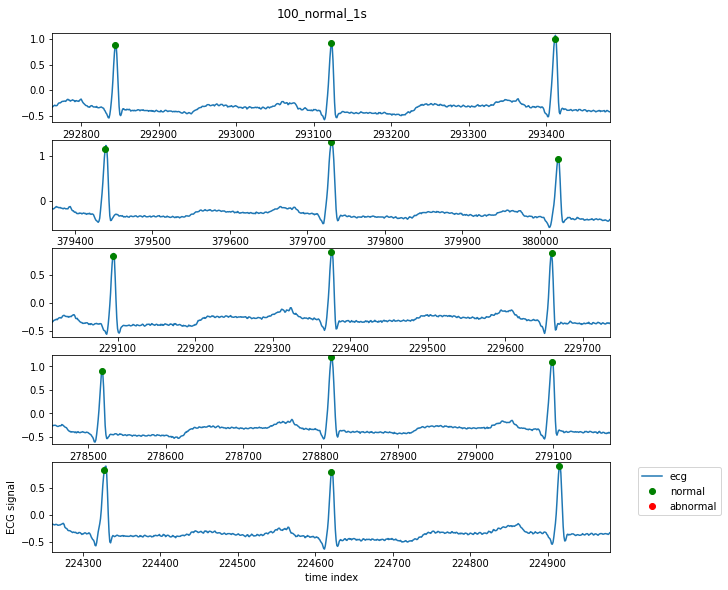

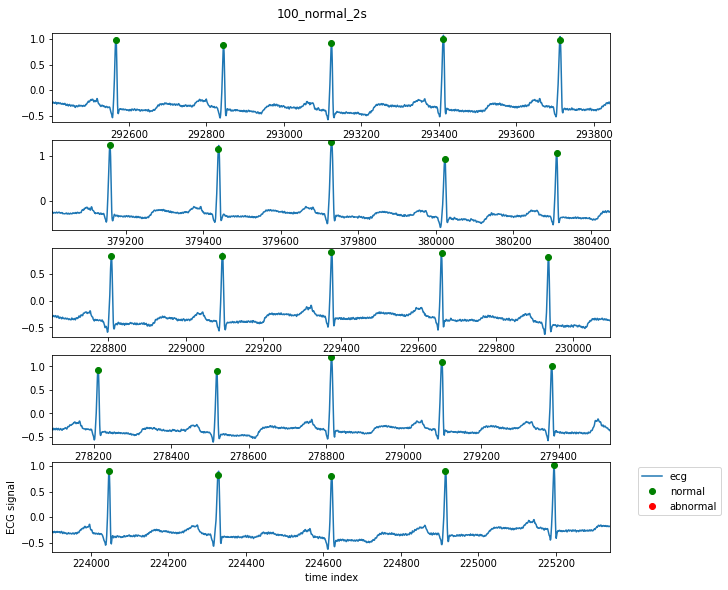

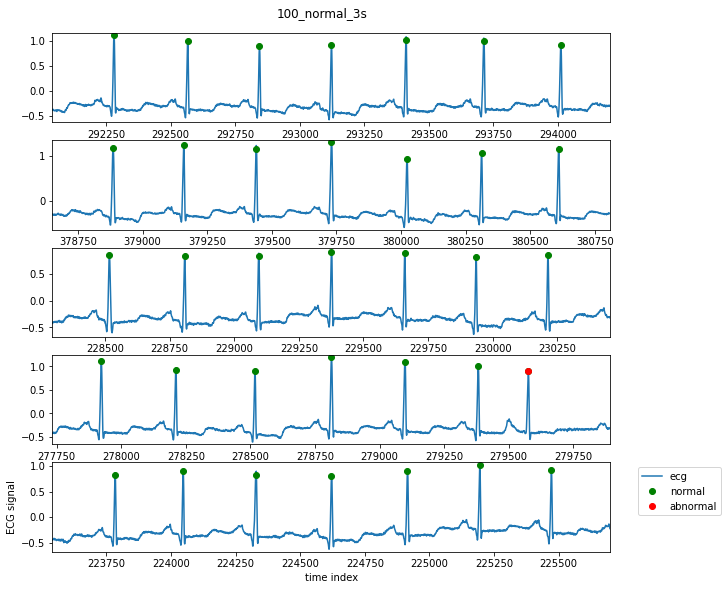

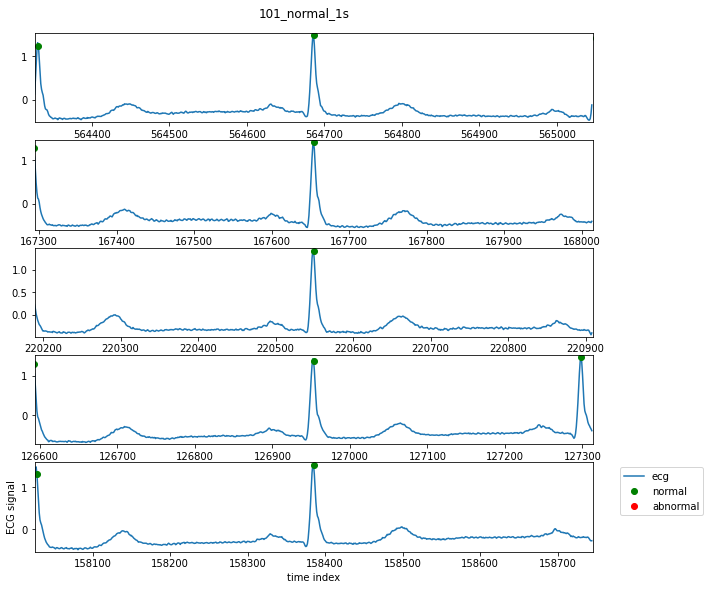

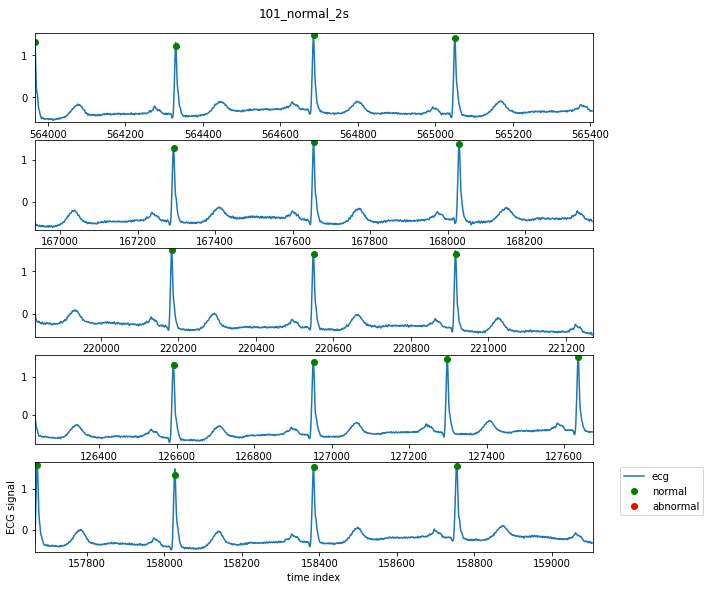

...

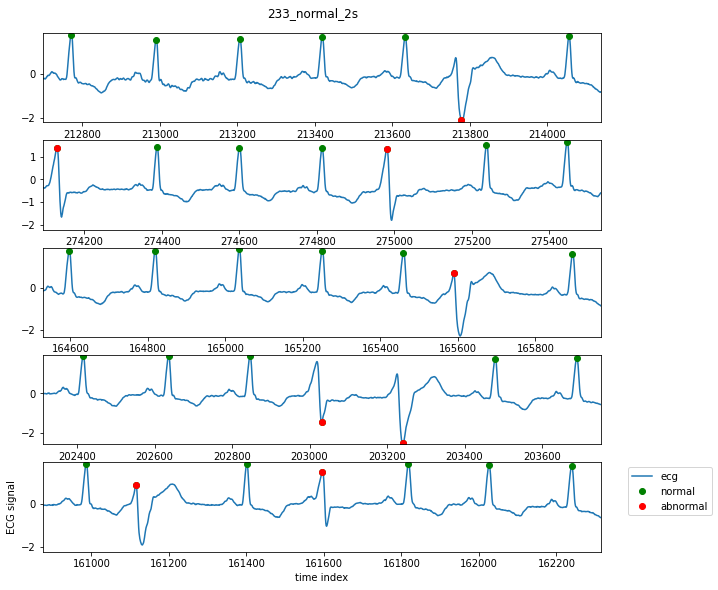

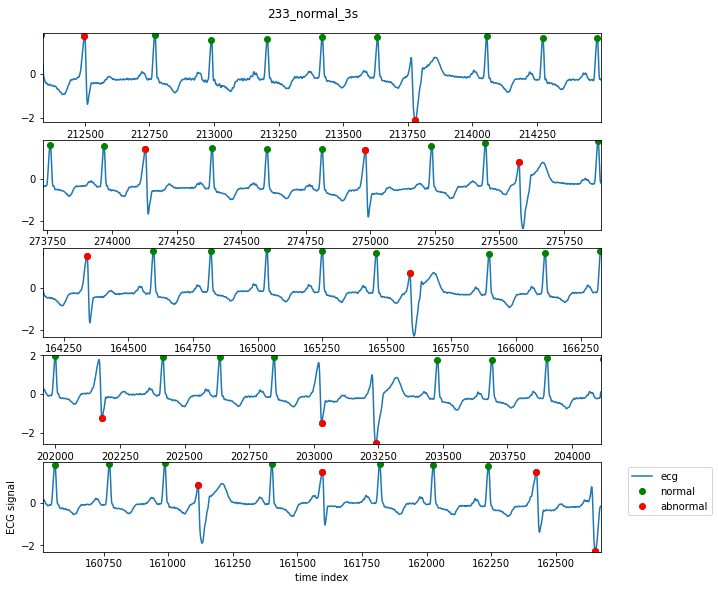

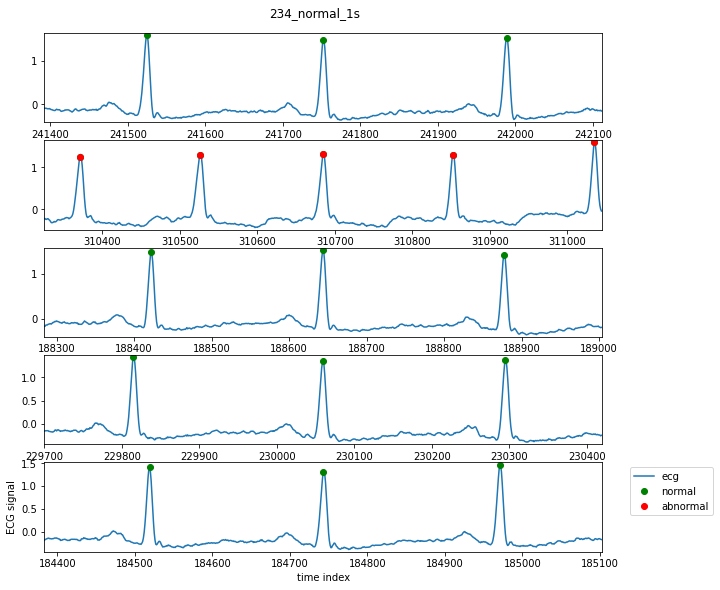

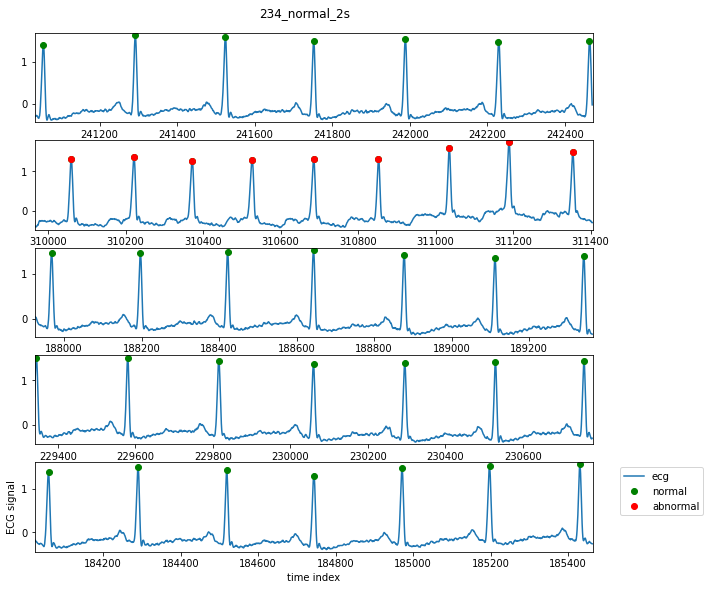

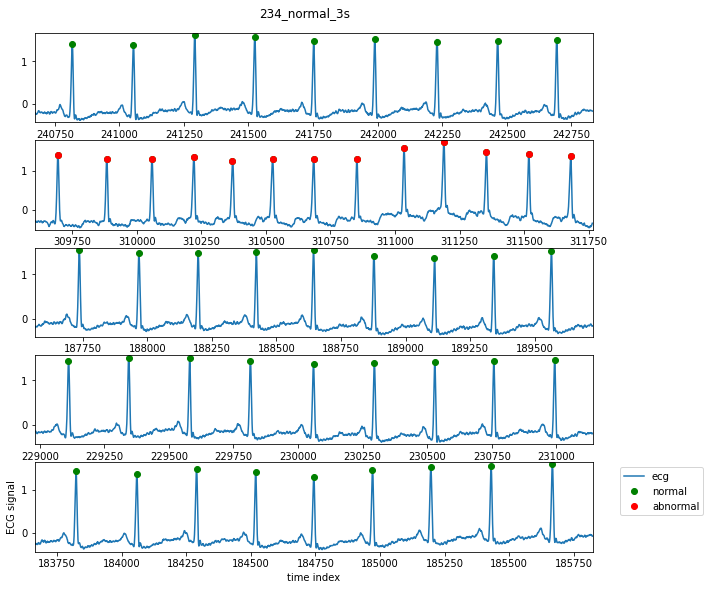

In [13]:
for i in range(len(pids)):
    tmp_index, yplt, ab_index, n_index, p_signal, atr_sym, atr_sample = rand_set(pids[i], 5, 'normal')
    
    ecg_plotting3(pids[i], 1, 'normal')
    ecg_plotting3(pids[i], 2, 'normal')
    ecg_plotting3(pids[i], 3, 'normal')

In [ ]:
for i in range(len(pids)):
    tmp_index, yplt, ab_index, n_index, p_signal, atr_sym, atr_sample = rand_set(pids[i], 5, 'abnormal')
    
    ecg_plotting3(pids[i], 1, 'abnormal')
    ecg_plotting3(pids[i], 2, 'abnormal')
    ecg_plotting3(pids[i], 3, 'abnormal')